## Load Dataset

In [ ]:
import pandas as pd
import numpy as np
import os
import zipfile
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
import tensorflow as tf
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tqdm.notebook import tqdm as tq
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/ML"

In [ ]:
%cd /content/gdrive/My Drive/ML

/content/gdrive/My Drive/ML


In [ ]:
!ls

animals10.zip


In [ ]:
# Ekstrak dataset

local_zip = '/content/gdrive/My Drive/ML/animals10.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/content/gdrive/My Drive/ML')
zip_ref.close()

In [ ]:
import os
from PIL import Image
base_dataset = "/content/gdrive/My Drive/ML/raw-img"
class_dir = ['scoiattolo','ragno','pecora','mucca','gatto','gallina','farfalla','elefante','cavallo','cane']
for class_item in class_dir:
  cur_dir = base_dataset + '/' + class_item + '/'
  dataset = os.listdir(cur_dir)
  for item in dataset :
    im = Image.open(f"{cur_dir}{item}")
    if item.endswith('.jpg'):
      if im.mode == "CMYK":
        im.convert('RGB')
      else :
        im.save(f"{cur_dir}{item.split('.')[0]}.png", "png")
    else :
      im.save(f"{cur_dir}{item.split('.')[0]}.png", "png")
  for item in dataset :
    if not item.endswith('.png'):
      os.remove(os.path.join(cur_dir, item))

## Splitting

In [ ]:
file_name = []
tag = []
full_path = []
for path, subdirs, files in os.walk(base_dataset):
    for name in files:
        full_path.append(os.path.join(path, name)) 
        tag.append(path.split('/')[-1])        
        file_name.append(name)

In [ ]:
# membuat dataframe dari variabel baru
data = pd.DataFrame({'path':full_path,'file_name':file_name,'tag':tag})
data.groupby(['tag']).size()

tag
cane          500
cavallo       500
elefante      499
farfalla      500
gallina       500
gatto         500
mucca         500
pecora        500
ragno         500
scoiattolo    500
dtype: int64

In [ ]:
x = data['path']
y = data['tag']

In [ ]:
!pip install split-folders

In [ ]:
data_dir = '/content/gdrive/MyDrive/ML/raw-img'
base_dir = '/content/gdrive/MyDrive/ML/raw-img/dataset'

In [ ]:
import splitfolders
splitfolders.ratio(data_dir, output=base_dir, seed=1337, ratio=(.8,.19,.01),group_prefix=None)

Copying files: 4999 files [01:09, 72.33 files/s]


In [ ]:
scoiattolo_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/scoiattolo"
scoiattolo_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/scoiattolo"
scoiattolo_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/scoiattolo"

ragno_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/ragno"
ragno_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/ragno"
ragno_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/ragno"

pecora_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/pecora"
pecora_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/pecora"
pecora_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/pecora"

mucca_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/mucca"
mucca_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/mucca"
mucca_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/mucca"

gatto_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/gatto"
gatto_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/gatto"
gatto_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/gatto"

gallina_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/gallina"
gallina_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/gallina"
gallina_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/gallina"

farfalla_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/farfalla"
farfalla_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/farfalla"
farfalla_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/farfalla"

elefante_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/elefante"
elefante_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/elefante"
elefante_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/elefante"

cavallo_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/cavallo"
cavallo_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/cavallo"
cavallo_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/cavallo"

cane_test = "/content/gdrive/MyDrive/ML/raw-img/dataset/test/cane"
cane_train = "/content/gdrive/MyDrive/ML/raw-img/dataset/train/cane"
cane_validation = "/content/gdrive/MyDrive/ML/raw-img/dataset/val/cane"


file_test_sco = os.listdir(scoiattolo_test)
file_train_sco = os.listdir(scoiattolo_train)
file_Val_sco = os.listdir(scoiattolo_validation)

file_test_rag = os.listdir(ragno_test)
file_train_rag = os.listdir(ragno_train)
file_Val_rag = os.listdir(ragno_validation)

file_test_pec = os.listdir(pecora_test)
file_train_pec = os.listdir(pecora_train)
file_Val_pec = os.listdir(pecora_validation)

file_test_muc = os.listdir(mucca_test)
file_train_muc = os.listdir(mucca_train)
file_Val_muc = os.listdir(mucca_validation)

file_test_gat = os.listdir(gatto_test)
file_train_gat = os.listdir(gatto_train)
file_Val_gat = os.listdir(gatto_validation)

file_test_gal = os.listdir(gallina_test)
file_train_gal = os.listdir(gallina_train)
file_Val_gal = os.listdir(gallina_validation)

file_test_far = os.listdir(farfalla_test)
file_train_far = os.listdir(farfalla_train)
file_Val_far = os.listdir(farfalla_validation)

file_test_ele = os.listdir(elefante_test)
file_train_ele = os.listdir(elefante_train)
file_Val_ele = os.listdir(elefante_validation)

file_test_cav = os.listdir(cavallo_test)
file_train_cav = os.listdir(cavallo_train)
file_Val_cav = os.listdir(cavallo_validation)

file_test_can = os.listdir(cane_test)
file_train_can = os.listdir(cane_train)
file_Val_can = os.listdir(cane_validation)

print("data scoiattolo test : " + str(len(file_test_sco)))
print("data scoiattolo train : " + str(len(file_train_sco)))
print("data scoiattolo validation : " + str(len(file_Val_sco)))

print("data ragno test : " + str(len(file_test_rag)))
print("data ragno train : " + str(len(file_train_rag)))
print("data ragno validation : " + str(len(file_Val_rag)))

print("data pecora test : " + str(len(file_test_pec)))
print("data pecora train : " + str(len(file_train_pec)))
print("data pecora validation : " + str(len(file_Val_pec)))

print("data mucca test : " + str(len(file_test_muc)))
print("data mucca train : " + str(len(file_train_muc)))
print("data mucca validation : " + str(len(file_Val_muc)))

print("data gatto test : " + str(len(file_test_gat)))
print("data gatto train : " + str(len(file_train_gat)))
print("data gatto validation : " + str(len(file_Val_gat)))

print("data gallina test : " + str(len(file_test_gal)))
print("data gallina train : " + str(len(file_train_gal)))
print("data gallina validation : " + str(len(file_Val_gal)))


print("data farfalla test : " + str(len(file_test_far)))
print("data farfalla train : " + str(len(file_train_far)))
print("data farfalla validation : " + str(len(file_Val_far)))

print("data elefante test : " + str(len(file_test_ele)))
print("data elefante train : " + str(len(file_train_ele)))
print("data elefante validation : " + str(len(file_Val_ele)))

print("data cavallo test : " + str(len(file_test_cav)))
print("data cavallo train : " + str(len(file_train_cav)))
print("data cavallo validation : " + str(len(file_Val_cav)))

print("data cane test : " + str(len(file_test_can)))
print("data cane train : " + str(len(file_train_can)))
print("data cane validation : " + str(len(file_Val_can)))

data scoiattolo test : 5
data scoiattolo train : 400
data scoiattolo validation : 95
data ragno test : 5
data ragno train : 400
data ragno validation : 95
data pecora test : 5
data pecora train : 400
data pecora validation : 95
data mucca test : 5
data mucca train : 400
data mucca validation : 95
data gatto test : 5
data gatto train : 400
data gatto validation : 95
data gallina test : 5
data gallina train : 400
data gallina validation : 95
data farfalla test : 5
data farfalla train : 400
data farfalla validation : 95
data elefante test : 6
data elefante train : 399
data elefante validation : 94
data cavallo test : 5
data cavallo train : 400
data cavallo validation : 95
data cane test : 5
data cane train : 400
data cane validation : 95


## Augmentasi

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
                    rescale=1./255)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   rescale=1./255,
                                   shear_range=0.2,
                                   horizontal_flip=True,
                                   fill_mode='nearest')

training_set = train_datagen.flow_from_directory("/content/gdrive/MyDrive/ML/raw-img/dataset/train",
                                                 target_size=(128,128),
                                                 color_mode="rgb",
                                                 shuffle=False,
                                                 batch_size = 8,
                                                 class_mode='categorical')

Found 3999 images belonging to 10 classes.


In [ ]:
validation_datagen = ImageDataGenerator(width_shift_range=0.2,
                                        height_shift_range=0.2,
                                        rescale=1./255,
                                        shear_range=0.2,
                                        horizontal_flip=True,
                                        fill_mode='nearest')

validation_set = validation_datagen.flow_from_directory("/content/gdrive/MyDrive/ML/raw-img/dataset/val",
                                                        target_size=(128,128),
                                                        color_mode="rgb",
                                                        shuffle=False,
                                                        batch_size = 8,
                                                        class_mode='categorical')

Found 949 images belonging to 10 classes.


In [ ]:
test_datagen = ImageDataGenerator(width_shift_range=0.2,
                                        height_shift_range=0.2,
                                        rescale=1./255,
                                        shear_range=0.2,
                                        horizontal_flip=True,
                                        fill_mode='nearest')

test_set = test_datagen.flow_from_directory("/content/gdrive/MyDrive/ML/raw-img/dataset/test",
                                                        target_size=(128,128),
                                                        color_mode="rgb",
                                                        shuffle=False,
                                                        batch_size = 8,
                                                        class_mode='categorical')

Found 51 images belonging to 10 classes.


## Hyparameter

In [ ]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [ ]:
%load_ext tensorboard

In [ ]:
!rm -rf ./logs/ 

In [ ]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([64, 128]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.2, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd', 'adadelta']))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [ ]:
xvl, yvl = zip(*(validation_set[i] for i in range(len(validation_set))))
x_val, y_val = np.vstack(xvl), np.vstack(yvl)

In [ ]:
def train_test_model(hparams):
  model = tf.keras.models.Sequential([tf.keras.layers.Conv2D(64, (5, 5), 
                                                             activation=tf.nn.relu, 
                                                             input_shape=(128,128,3)),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
                                      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
                                      tf.keras.layers.Conv2D(64, (5, 5), 
                                                             activation=tf.nn.relu),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
                                      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
                                      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
                                      tf.keras.layers.Conv2D(32, (5, 5), 
                                                             activation=tf.nn.relu),
                                      tf.keras.layers.BatchNormalization(),
                                      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
                                      tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
                                      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
                                      tf.keras.layers.Flatten(),
                                      tf.keras.layers.Dense(hparams[HP_NUM_UNITS], 
                                                            activation=tf.nn.relu),
                                      tf.keras.layers.Dense(64, activation=tf.nn.relu),
                                      tf.keras.layers.Dense(32, activation=tf.nn.relu),
                                      tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
                                      tf.keras.layers.Dense(10, activation=tf.nn.softmax),
                                      ])

  model.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss='binary_crossentropy',
      metrics=['accuracy'],
  )

  model.fit(training_set, 
            validation_data=validation_set, 
            epochs=5,
            )
  _, accuracy = model.evaluate(x_val, y_val)
  return accuracy

In [ ]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
['adam', 'sgd', 'adadelta', 'rmsprop', 'adamx', 'nadam']

['adam', 'sgd', 'adadelta', 'rmsprop', 'adamx', 'nadam']

In [ ]:
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
  for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
    for optimizer in HP_OPTIMIZER.domain.values:
      hparams = {
          HP_NUM_UNITS: num_units,
          HP_DROPOUT: dropout_rate,
          HP_OPTIMIZER: optimizer,
      }
      run_name = "run-%d" % session_num
      print('--- Starting trial: %s' % run_name)
      print({h.name: hparams[h] for h in hparams})
      run('logs/hparam_tuning/' + run_name, hparams)
      session_num += 1


--- Starting trial: run-0
{'num_units': 64, 'dropout': 0.2, 'optimizer': 'adadelta'}
Epoch 1/5
500/500 [==============================] - 381s 760ms/step - loss: 0.4421 - accuracy: 0.1020 - val_loss: 0.3439 - val_accuracy: 0.0948
Epoch 2/5
500/500 [==============================] - 379s 759ms/step - loss: 0.4320 - accuracy: 0.0983 - val_loss: 0.3549 - val_accuracy: 0.0938
Epoch 3/5
500/500 [==============================] - 378s 756ms/step - loss: 0.4196 - accuracy: 0.1040 - val_loss: 0.3526 - val_accuracy: 0.0864
Epoch 4/5
500/500 [==============================] - 379s 758ms/step - loss: 0.4133 - accuracy: 0.1045 - val_loss: 0.3502 - val_accuracy: 0.1022
Epoch 5/5
30/30 [==============================] - 17s 549ms/step - loss: 0.3462 - accuracy: 0.0906
--- Starting trial: run-1
{'num_units': 64, 'dropout': 0.2, 'optimizer': 'adam'}
Epoch 1/5
500/500 [==============================] - 388s 775ms/step - loss: 0.3310 - accuracy: 0.1105 - val_loss: 0.3241 - val_accuracy: 0.1507
Epoch 2/5

## Evaluasi

In [ ]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

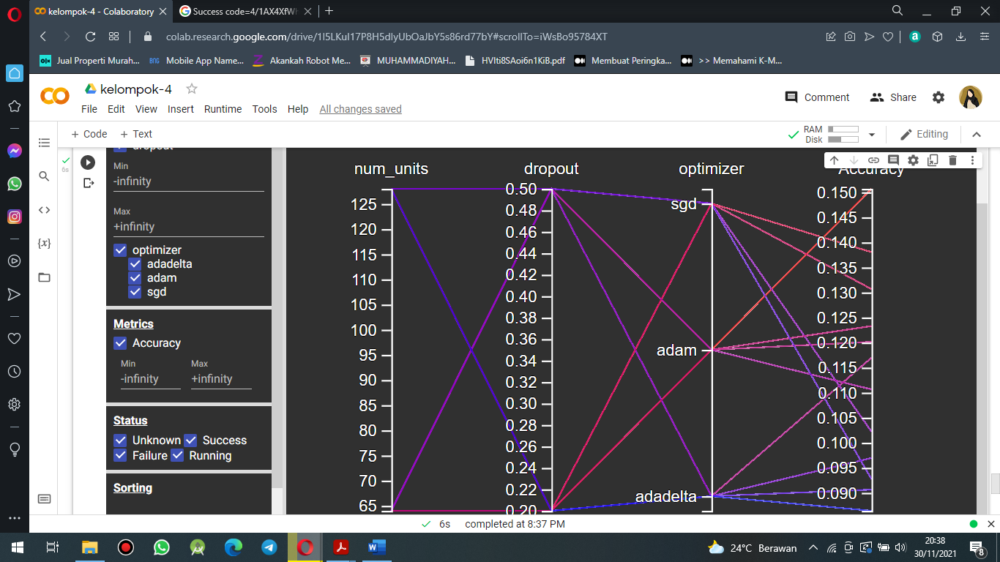